In [2]:
import matplotlib.pyplot as plt
import cv2


import scipy

from pathlib import Path

import numpy as np

import h5py
import math


import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

import holoviews as hv

import platform

import sys
sys.path.insert(0, "..")

from pathlib import Path

import cv2

import json


from Utilities.Utils import *
from Utilities.Processing import *

In [10]:
ballpath = Path('/mnt/labserver/DURRIEU_Matthias/Experimental_data/MultiMazeRecorder/Videos/230721_Feedingstate_4_PM_Videos_Tracked/arena5/corridor3/corridor3_tracked.000_corridor3.analysis.h5')

flypath = Path('/mnt/labserver/DURRIEU_Matthias/Experimental_data/MultiMazeRecorder/Videos/230721_Feedingstate_4_PM_Videos_Tracked/arena5/corridor3/flytrack.000_corridor3.analysis.h5')

vidpath = Path('/mnt/labserver/DURRIEU_Matthias/Experimental_data/MultiMazeRecorder/Videos/230721_Feedingstate_4_PM_Videos_Tracked/arena5/corridor3/corridor3.mp4')



In [11]:
# import the h5 file

with h5py.File(ballpath.as_posix(), "r") as f:
            dset_names = list(f.keys())
            ball_locs = f["tracks"][:].T
            node_names = [n.decode() for n in f["node_names"][:]]

In [12]:
with h5py.File(flypath.as_posix(), "r") as f:
            dset_names = list(f.keys())
            fly_locs = f["tracks"][:].T
            node_names = [n.decode() for n in f["node_names"][:]]

In [13]:
yball = ball_locs[:, :, 1, :]
xball = ball_locs[:, :, 0, :]


yfly = fly_locs[:, :, 1, :]
xfly = fly_locs[:, :, 0, :]

In [27]:
import numpy as np

def replace_nans_with_previous_value(arr):
    # Find the indices of the NaN values
    nan_indices = np.where(np.isnan(arr))

    # Replace the NaN values with the previous value
    for i in nan_indices[0]:
        arr[i] = arr[i-1]

# Replace NaNs in yball
replace_nans_with_previous_value(yball)

# Replace NaNs in xball
replace_nans_with_previous_value(xball)

# Replace NaNs in yfly
replace_nans_with_previous_value(yfly)

# Replace NaNs in xfly
replace_nans_with_previous_value(xfly)


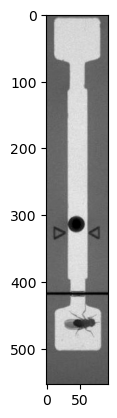

In [14]:
# Load the first frame of the video and display it
cap = cv2.VideoCapture(vidpath.as_posix())
ret, frame = cap.read()
if ret:
    plt.imshow(frame)
    plt.show()
else:
    print('Error: Could not read frame from video')
    

In [23]:
import cv2
import numpy as np

def create_marked_video(video_path, xfly, yfly, xball, yball, start_frame, end_frame, output_path):
    # Open the input video file
    cap = cv2.VideoCapture(video_path)
    
    # Get the video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    
    # Create the output video file
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
    
    # Set the position of the video to the start frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
    
    # Process each frame of the video
    for i in range(start_frame, end_frame+1):
        # Read the next frame from the input video
        ret, frame = cap.read()
        
        # Check if the frame was successfully read
        if not ret:
            break
        
        # Get the positions of the fly and ball in this frame
        fly_pos = (int(xfly[i]), int(yfly[i]))
        ball_pos = (int(xball[i]), int(yball[i]))
        
        # Draw a circle at each position
        cv2.circle(frame, fly_pos, 5, (0, 0, 255), -1)
        cv2.circle(frame, ball_pos, 5, (255, 0, 0), -1)
        
        # Draw a larger circle around the ball marker
        cv2.circle(frame, ball_pos, 12, (255, 0, 0), 2)
        
        # Write the frame to the output video
        out.write(frame)
    
    # Release the video capture and writer
    cap.release()
    out.release()



In [28]:
outpath = Path('/mnt/labserver/DURRIEU_Matthias/Videos/ballflytrack_sample.mp4')

create_marked_video(vidpath.as_posix(), xfly, yfly, xball, yball, 66600, 72000, outpath.as_posix())


In [29]:
yball_smooth = savgol_lowpass_filter(yball, 221, 1)

yfly_smooth = savgol_lowpass_filter(yfly, 221, 1)



ValueError: If mode is 'interp', window_length must be less than or equal to the size of x.

In [39]:
import numpy as np
import pandas as pd

# Combine the yball and yfly arrays into a single 2D array
data = np.stack((yball.squeeze(), yfly.squeeze()), axis=1)

# Create a pandas DataFrame from the data
df = pd.DataFrame(data, columns=['yball', 'yfly'])

# Display the first few rows of the DataFrame
print(df.head())


        yball        yfly
0  312.864868  461.939789
1  312.902557  462.152802
2  312.834259  459.754120
3  312.923767  459.604584
4  312.914856  459.899689


In [47]:
start, end = np.load(vidpath.parent / 'coordinates.npy')

#df['yball_relative'] = abs(df['yball'] - start)

#df['yfly_relative'] = abs(df['yfly'] - start)

df['yball_smooth'] = savgol_lowpass_filter(df['yball'], 221, 1)

df['yfly_smooth'] = savgol_lowpass_filter(df['yfly'], 221, 1)

df = df.assign(Frame=df.index + 1)


df["time"] = df["Frame"] / 30

df.head()

,yball,yfly,yball_relative,yball_smooth,frame_number,yfly_relative,yfly_smooth,Frame,time
0,312.864868,461.939789,75.135132,313.494617,1,73.939789,465.967944,1,0.033333
1,312.902557,462.152802,75.097443,313.493949,2,74.152802,466.024429,2,0.066667
2,312.834259,459.754120,75.165741,313.493281,3,71.754120,466.080914,3,0.100000
3,312.923767,459.604584,75.076233,313.492613,4,71.604584,466.137399,4,0.133333
4,312.914856,459.899689,75.085144,313.491945,5,71.899689,466.193885,5,0.166667


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
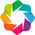

:Overlay
   .Curve.Yfly_smooth  :Curve   [x]   (y)
   .Curve.Yball_smooth :Curve   [x]   (y)

In [52]:
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

# Create a Holoviews Curve for each data series
yball_curve = hv.Curve((df['time'], df['yball']), label='yball').opts(color='lightblue')
yball_smooth_curve = hv.Curve((df['time'], df['yball_smooth']), label='yball_smooth').opts(color='blue')
yfly_curve = hv.Curve((df['time'], df['yfly']), label='yfly').opts(color='lightcoral')
yfly_smooth_curve = hv.Curve((df['time'], df['yfly_smooth']), label='yfly_smooth').opts(color='red')

# Overlay the curves to create the final plot
plot = yfly_smooth_curve * yball_smooth_curve #yball_curve * yfly_curve

# Set some options for the plot
plot.opts(
    opts.Curve(width=1200, height=800),
    opts.Overlay(legend_position='top_left')
)

# Display the plot
plot

# TODO: revert y-axis

In [63]:
# Compute the difference between the yball and yfly positions smoothed

df['dist'] =  df['yfly_smooth'] - df['yball_smooth']

In [64]:
Thresh = 80

# Locate where the distance is below the threshold
df['close'] = df['dist'] < Thresh

In [65]:
df['close']

0         False
1         False
2         False
3         False
4         False
          ...  
215995     True
215996     True
215997     True
215998     True
215999     True
Name: close, Length: 216000, dtype: bool

In [66]:
#df = df.reset_index()

# Find the start and end indices of streaks of True values in the 'close' column
df['block'] = (df['close'].shift(1) != df['close']).cumsum()
events = df[df['close']].groupby('block').agg(start=('index', 'min'), end=('index', 'max'))

# Store the interaction events as separate DataFrames
interaction_events = [df.loc[start:end] for start, end in events[['start', 'end']].itertuples(index=False)]

# You can then use these DataFrames to generate your grid video

In [67]:
interaction_events

[      index       yball        yfly  yball_relative  yball_smooth  \
 565     565  312.963684  367.638824       75.036316    313.117813   
 566     566  312.934631  367.548584       75.065369    313.110161   
 567     567  312.955841  363.386719       75.044159    313.109976   
 568     568  312.911713  363.087036       75.088287    313.109778   
 569     569  312.915619  363.346710       75.084381    313.109594   
 ...     ...         ...         ...             ...           ...   
 1827   1827  326.663391  381.730225       61.336609    326.779094   
 1828   1828  326.671783  379.410217       61.328217    326.786520   
 1829   1829  326.616699  383.759552       61.383301    326.786520   
 1830   1830  326.684357  384.086792       61.315643    326.786551   
 1831   1831  326.614471  386.229126       61.385529    326.786484   
 
       frame_number  yfly_relative  yfly_smooth  Frame       time       dist  \
 565            566      20.361176   393.102942    566  18.866667  79.985130  

In [68]:
interaction_events[0]

,index,yball,yfly,yball_relative,yball_smooth,frame_number,yfly_relative,yfly_smooth,Frame,time,dist,close,block
565,565,312.963684,367.638824,75.036316,313.117813,566,20.361176,393.102942,566,18.866667,79.985130,True,2
566,566,312.934631,367.548584,75.065369,313.110161,567,20.451416,392.843159,567,18.900000,79.732999,True,2
567,567,312.955841,363.386719,75.044159,313.109976,568,24.613281,392.572033,568,18.933333,79.462057,True,2
568,568,312.911713,363.087036,75.088287,313.109778,569,24.912964,392.300807,569,18.966667,79.191029,True,2
569,569,312.915619,363.346710,75.084381,313.109594,570,24.653290,392.040941,570,19.000000,78.931347,True,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1827,1827,326.663391,381.730225,61.336609,326.779094,1828,6.269775,404.709576,1828,60.933333,77.930482,True,2
1828,1828,326.671783,379.410217,61.328217,326.786520,1829,8.589783,405.187254,1829,60.966667,78.400734,True,2
1829,1829,326.616699,383.759552,61.383301,326.786520,1830,4.240448,405.667098,1830,61.000000,78.880579,True,2
1830,1830,326.684357,384.086792,61.315643,326.786551,1831,3.913208,406.165327,1831,61.033333,79.378776,True,2


In [71]:
# get the length of each event
event_lengths = [len(event) for event in interaction_events]

print(event_lengths)

[1267, 171, 200, 198, 438, 179, 235, 332, 156, 317, 152, 189, 161, 201, 193, 265, 262, 320, 72, 134, 902, 429, 444, 523, 416, 219, 380, 183, 93, 83, 290, 453, 1441, 1409, 136, 213, 270, 2148, 249, 618, 160, 302, 228, 119, 606, 1070, 396, 800, 149, 513, 110, 281, 251, 659, 643, 148, 1872, 218, 94, 493, 196, 134, 232, 1194, 422, 115, 108, 882, 601, 75, 802, 1672, 347, 276, 259, 320, 132, 271, 146, 431, 327, 629, 283, 193, 153, 481, 1029, 584, 1138, 549, 1261, 2885, 598, 188, 374, 1243, 283, 123, 661, 660, 364, 88, 213, 349, 306, 174, 168, 86, 117, 673, 341, 206, 223, 258, 327, 439, 1231, 920, 394, 426, 264, 67, 265, 177, 70, 251, 619, 190, 111, 259, 256, 265, 108, 375, 204, 130, 677, 108, 283, 377, 251, 81, 410, 182, 1580, 135, 876, 221, 571, 112, 332, 495, 75, 439, 121, 162, 81, 119, 118, 140, 352, 198, 178, 88, 140, 85, 94, 98, 383, 462, 195, 66, 576, 198, 152, 86, 60, 191, 133, 459, 69, 440, 63, 266, 208, 92, 60, 243, 328, 221, 70, 560, 464, 739, 253, 150, 331, 172, 175, 1207, 74, 270

In [70]:
# remove events that are less than 60 frames long
interaction_events = [event for event in interaction_events if len(event) >= 60]


In [79]:
from moviepy.editor import VideoFileClip, clips_array

# Load the input video
input_video = VideoFileClip(vidpath.as_posix())

# Assuming you have a list of DataFrames representing the interaction events
interaction_events = [df for df in interaction_events]

# Determine the start and end times of each event in the video
event_times = [(df['time'].min(), df['time'].max()) for df in interaction_events]

# Extract the video chunks corresponding to each event
video_clips = [input_video.subclip(start_time, end_time) for start_time, end_time in event_times]

# Determine the number of rows and columns for the grid video
num_clips = len(video_clips)
num_cols = math.ceil(math.sqrt(num_clips))
num_rows = math.ceil(num_clips / num_cols)

# Create a blank VideoClip object with the same size as your other video clips
clip_size = video_clips[0].size
blank_clip = ColorClip(size=clip_size, color=(0, 0, 0), duration=1)

# Pad the list of video clips with blank VideoClip objects to fill the empty elements in the 2D array
video_clips += [blank_clip] * (num_rows * num_cols - num_clips)

# Reshape the list of video clips into a 2D array with the desired number of rows and columns
video_clips_array = np.reshape(video_clips, (num_rows, num_cols))

# Create a grid video from the video clips array
grid_video = clips_array(video_clips_array)

outpath = Path('/mnt/labserver/DURRIEU_Matthias/Videos/EventsGrid.mp4')

# Write the grid video to a file
grid_video.write_videofile(outpath.as_posix())


NameError: name 'ColorClip' is not defined

In [82]:
from moviepy.editor import VideoFileClip, clips_array

def create_grid_video(input_path, event_times, output_path=None):
    # Load the input video
    input_video = VideoFileClip(input_path)

    # Extract the video chunks corresponding to each event
    clips = [input_video.subclip(start_time, end_time) for start_time, end_time in event_times]

    # Create a grid from the clips
    grid = clips_array([clips])

    # Set the output path for the grid video
    if not output_path:
        output_path = "grid.mp4"

    # Write the grid video to a file
    grid.write_videofile(output_path)

# Example usage
event_times = [(df['time'].min(), df['time'].max()) for df in interaction_events]

vidpath = Path('/mnt/labserver/DURRIEU_Matthias/Experimental_data/MultiMazeRecorder/Videos/230721_Feedingstate_4_PM_Videos_Tracked/arena5/corridor3/corridor3.mp4')
outpath = Path('/mnt/labserver/DURRIEU_Matthias/Videos/EventsGrid.mp4')


  # start and end times of the events in seconds
create_grid_video(input_path='/mnt/labserver/DURRIEU_Matthias/Experimental_data/MultiMazeRecorder/Videos/230721_Feedingstate_4_PM_Videos_Tracked/arena5/corridor3/corridor3.mp4', 
                  event_times = event_times, 
                  output_path='/mnt/labserver/DURRIEU_Matthias/Videos/EventsGrid.mp4')


t:   0%|          | 3/2884 [06:25<24:28:17, 30.58s/it, now=None]

Moviepy - Building video /mnt/labserver/DURRIEU_Matthias/Videos/EventsGrid.mp4.
Moviepy - Writing video /mnt/labserver/DURRIEU_Matthias/Videos/EventsGrid.mp4



In [ ]:
from joblib import Parallel, delayed
from moviepy.editor import VideoFileClip

def write_clip(input_path, start_time, end_time, output_path):
    # Load the input video
    input_video = VideoFileClip(input_path)

    # Extract the video chunk corresponding to the event
    clip = input_video.subclip(start_time, end_time)

    # Write the video clip to a file
    clip.write_videofile(output_path)

# Example usage
input_path = '/mnt/labserver/DURRIEU_Matthias/Experimental_data/MultiMazeRecorder/Videos/230721_Feedingstate_4_PM_Videos_Tracked/arena5/corridor3/corridor3.mp4'
event_times = event_times  # start and end times of the events in seconds
output_paths = [f'/mnt/labserver/DURRIEU_Matthias/Videos/GridClips/clip_{i}.mp4' for i in range(len(event_times))]

# Write the individual video clips in parallel
Parallel(n_jobs=-1)(
    delayed(write_clip)(input_path, start_time, end_time, output_path)
    for start_time, end_time, output_path in zip(event_times, output_paths)
)
